### Pipeline

This script takes a single 2D TIFF frame, extracts a region of interest (ROI), removes a smooth background, and then uses juwavelet to identify and visualize the main gravity‐wave packets.

Pipeline:

1. Load the full TIFF as a 2D float32 array and compute the global mean and sigma.
2. Build a full-frame preview:
   - Mask pixels outside mean ± (SIGMA_FACTOR · σ).
   - Display the masked image with a fixed color range and draw the ROI rectangle.
3. Extract the ROI using X_SLICE and Y_SLICE.
4. Apply the same global mean ± σ range filter inside the ROI (optional), and fill “invalid” pixels (outside the range) so the ROI remains a full rectangle for the CWT.
5. Remove a smooth background from the ROI:
   - Fit and subtract a 2D plane (optional).
   - Extract and subtract the first Fourier components in x and y.
   - Define the “remaining” field = original − background.
6. Apply a Hanning edge taper to the remaining field (optional), then optionally despike it using a local median / MAD filter (DESPIKE_SIZE, DESPIKE_K).
7. Make a 4-panel figure showing:
   - Original (median-subtracted).
   - Background (plane + first Fourier).
   - Remaining = original − background.
   - Remaining with edge taper (and spikes removed).
8. Preprocess the tapered, despiked field for CWT:
   - Median-center and standardize (optional).
   - Apply a small Gaussian blur (optional).
9. Run 2D continuous wavelet transform with juwavelet.decompose2d using the specified S0, DJ, JS, JT, DX, DY, ASPECT.
10. Identify wave clusters in wavelet space with utils.identify_cluster2d (CLUSTER_MIN_AMP, CLUSTER_THR).
11. Plot:
    - A decomposition overview (utils.plot_decomposition2d).
    - A FOV wavelet spectrum (orientation vs wavelength) via plot_utils.plot_fov_wavelet_spectrum.
12. For the 9 strongest clusters:
    - Reconstruct each cluster back into physical space.
    - Plot 9 standalone cluster fields (median-centered).
    - Plot 9 overlays: each cluster on top of the tapered, despiked background field.

Outputs: one full-frame preview, one 4-panel background figure, a CWT summary figure, a polar FOV spectrum, 9 standalone cluster plots, and 9 cluster-on-background overlays.


### Animation

Loaded 50 frames (from 600 to 649)
shape = (50, 256, 320)

UT times of displayed frames:
Frame  600  BandOH_caun0601.tif                       2025-01-03T06:26:34Z
Frame  601  BandOH_caun0602.tif                       2025-01-03T06:27:08Z
Frame  602  BandOH_caun0603.tif                       2025-01-03T06:27:41Z
Frame  603  BandOH_caun0604.tif                       2025-01-03T06:28:14Z
Frame  604  BandOH_caun0605.tif                       2025-01-03T06:28:48Z
Frame  605  BandOH_caun0606.tif                       2025-01-03T06:29:21Z
Frame  606  BandOH_caun0607.tif                       2025-01-03T06:29:55Z
Frame  607  BandOH_caun0608.tif                       2025-01-03T06:30:28Z
Frame  608  BandOH_caun0609.tif                       2025-01-03T06:31:01Z
Frame  609  BandOH_caun0610.tif                       2025-01-03T06:31:35Z
Frame  610  BandOH_caun0611.tif                       2025-01-03T06:32:08Z
Frame  611  BandOH_caun0612.tif                       2025-01-03T06:32:41Z
Frame  612 

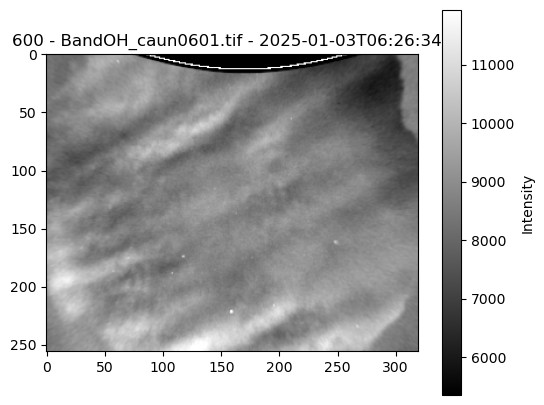

In [2]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from datetime import datetime

# --------------------
# User settings
# --------------------
FOLDER = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Jan02-03"
FACTOR = 1          # center ± FACTOR * sigma range
START_INDEX = 600     # starting frame (0-based)
N_SHOW = 50          # number of frames to show

# --------------------
# Helper: read UT time from MTM TIFF header
# --------------------
def read_ut_time_from_tiff(path):
    """
    Read UT time from the custom MTM header inside the TIFF.

    Uses the offsets from the format document:
      247-250: UT second   (ULON)
      251-254: UT minute   (ULON)
      255-258: UT hour     (ULON)
      259-262: UT day      (ULON)
      263-266: UT month    (ULON, +1 = month)
      267-270: UT year     (ULON, +1900 = year)
    Byte order is little endian ("ll" in header).
    """
    import numpy as np

    with open(path, "rb") as f:
        header = f.read(300)  # enough to cover all time fields

    def u4(offset):
        # little-endian unsigned 4-byte integer
        return np.frombuffer(header[offset:offset+4], dtype="<u4")[0]

    sec   = int(u4(247))
    minute = int(u4(251))
    hour   = int(u4(255))
    day    = int(u4(259))
    month  = int(u4(263)) + 1     # +1 = month
    year   = int(u4(267)) + 1900  # +1900 = year

    return datetime(year, month, day, hour, minute, sec)

# --------------------
# Load all TIFFs
# --------------------
files_all = sorted(glob.glob(os.path.join(FOLDER, "*.tif")))
if not files_all:
    raise FileNotFoundError("No TIFFs found in folder.")

# Limit to desired range
files = files_all[START_INDEX: START_INDEX + N_SHOW]

frames = []
for f in files:
    img = tiff.imread(f)
    frames.append(img.astype(np.float32))

data = np.stack(frames, axis=0)

print(f"Loaded {len(files)} frames (from {START_INDEX} to {START_INDEX+len(files)-1})")
print(f"shape = {data.shape}")

# --------------------
# Read UT time for each displayed frame
# --------------------
times_utc = [read_ut_time_from_tiff(f) for f in files]

print("\nUT times of displayed frames:")
for i, (fname, t_utc) in enumerate(zip(files, times_utc)):
    frame_idx = START_INDEX + i
    print(f"Frame {frame_idx:4d}  {os.path.basename(fname):40s}  {t_utc.isoformat()}Z")

# --------------------
# Compute intensity range
# --------------------
sample = data.ravel()
center = float(np.mean(sample))
sigma = float(np.std(sample))

vmin = center - FACTOR * sigma
vmax = center + FACTOR * sigma

print(f"\ncenter: {center:.2f}, sigma: {sigma:.2f}")
print(f"use range: [{vmin:.2f}, {vmax:.2f}]")

# --------------------
# Plot animation
# --------------------
fig, ax = plt.subplots(figsize=(6, 5))

im = ax.imshow(
    np.clip(data[0], vmin, vmax),
    cmap="gray",
    vmin=vmin, vmax=vmax,
    origin="upper"
)

# Include frame index, filename, and UT time in the title
title = ax.set_title(
    f"{START_INDEX} - {os.path.basename(files[0])} - {times_utc[0].isoformat()}Z"
)
plt.colorbar(im, ax=ax, label="Intensity")

def update(i):
    im.set_data(np.clip(data[i], vmin, vmax))
    t_utc = times_utc[i]
    title.set_text(
        f"{START_INDEX + i} - {os.path.basename(files[i])} - {t_utc.isoformat()}Z"
    )
    return im, title

anim = FuncAnimation(fig, update, frames=len(files), interval=400, blit=False)

HTML(anim.to_jshtml())


## One Frame, 
Satellite 6:32:32 UT, between frame 610 and 611 ground-based. 
Frame  610  BandOH_caun0611.tif                       2025-01-03T06:32:08Z

[Full] mean: 8811.37
[Full] sigma: 3287.02
[Full] Clip range: [7167.86, 10454.88] = mean ± 0.50·sigma
[Full] Count: 81920
[Full] Min/max after clip: 7167.86 / 10454.88
[Full] Percentiles 5/50/95 (clipped): 7167.86 / 8856.00 / 10270.00


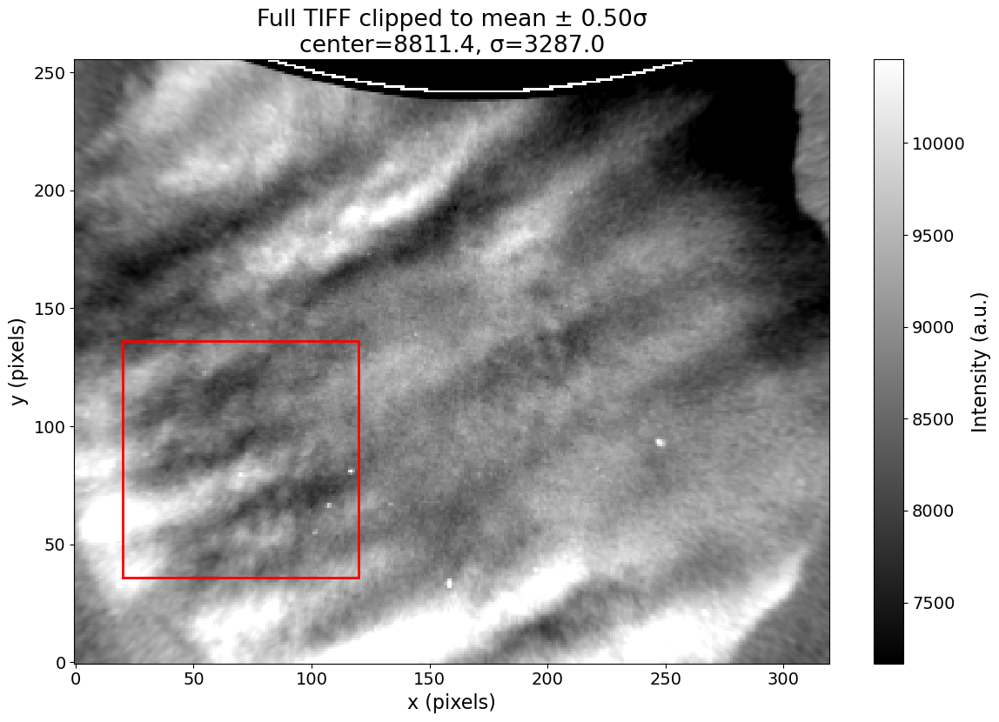

[ROI] shape: (100, 100)
[ROI] Count: 10000
[ROI] Min/max after clip: 7715.00 / 10454.88
[ROI] Percentiles 5/50/95 (clipped): 8128.00 / 8794.00 / 10007.10


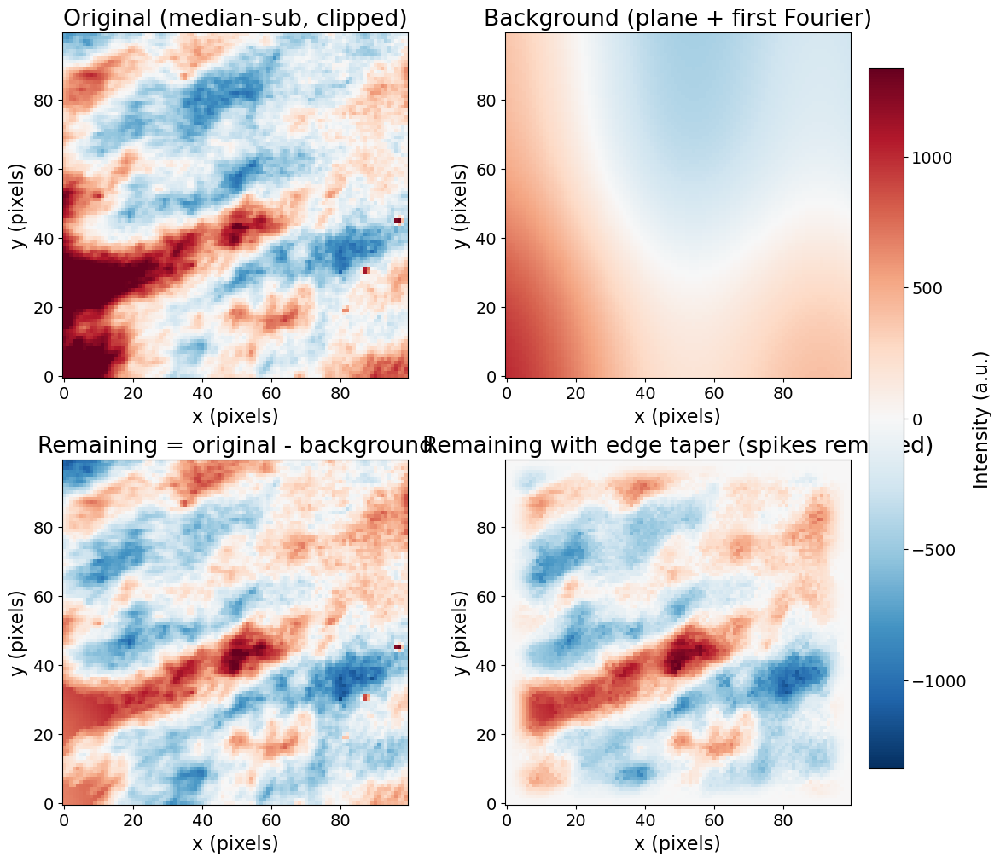

C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.8946465209023797 idx= (np.int64(16), np.int64(7), np.int64(43), np.int64(54))
selected elements: 333869
------------
cluster= 1
amplitude= 0.2887306077507618 idx= (np.int64(11), np.int64(4), np.int64(20), np.int64(33))
selected elements: 3310
------------
cluster= 2
amplitude= 0.28065241609196573 idx= (np.int64(12), np.int64(3), np.int64(23), np.int64(27))
selected elements: 1587
------------
cluster= 3
amplitude= 0.2742037093309896 idx= (np.int64(17), np.int64(9), np.int64(11), np.int64(53))
selected elements: 4306
------------
cluster= 4
amplitude= 0.2607799868401228 idx= (np.int64(9), np.int64(8), np.int64(35), np.int64(84))
selected elements: 3225
------------
cluster= 5
amplitude= 0.25609376347747803 idx= (np.int64(13), np.int64(9), np.int64(60), np.int64(75))
selected elements: 1294
------------
cluster= 6
amplitude= 0.2546142681785279 idx= (np.int64(6), np.int64(5), np.int64(57), np.int64(69))
selected elements: 1262
------------
cluster= 7
a

C:\Users\domin\juwavelet\juwavelet\utils.py:67: RuntimeWarning: divide by zero encountered in scalar divide
  hl = 1. / np.sin(theta[sel_t[j]])
100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 88.80it/s]
C:\Users\domin\juwavelet\juwavelet\utils.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


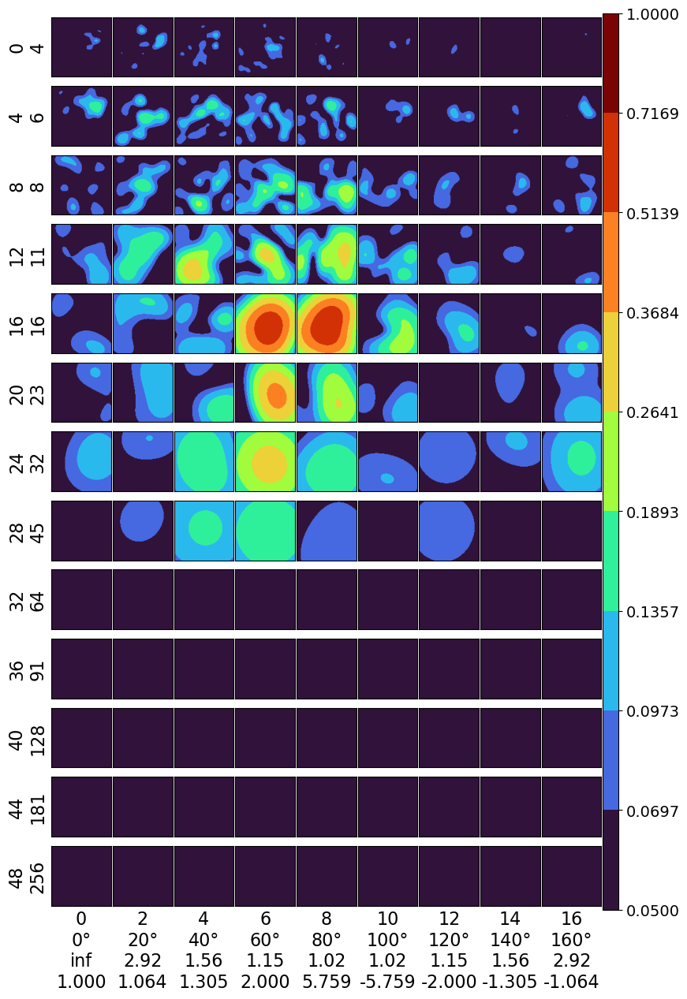

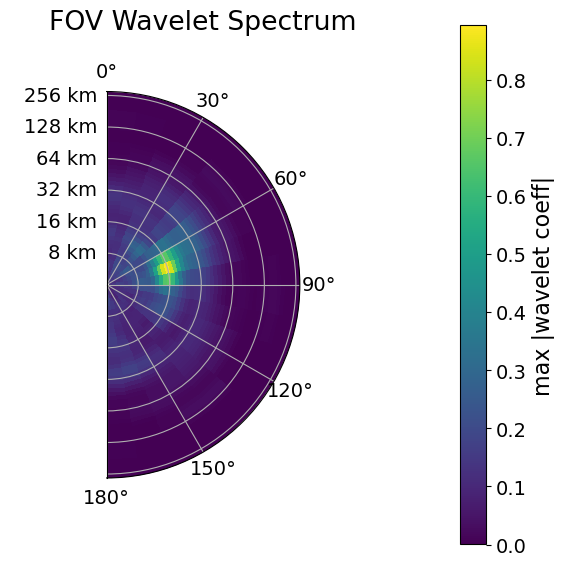

[Clusters-only] Cluster 0: amp=0.895, lamx=46.78, lamy=17.03, lam=16.00
[Clusters-only] Cluster 1: amp=0.289, lamx=13.54, lamy=16.14, lam=10.37
[Clusters-only] Cluster 2: amp=0.281, lamx=13.06, lamy=22.63, lam=11.31
[Clusters-only] Cluster 3: amp=0.274, lamx=284949484778667392.00, lamy=17.45, lam=17.45
[Clusters-only] Cluster 4: amp=0.261, lamx=50.24, lamy=8.86, lam=8.72
[Clusters-only] Cluster 5: amp=0.256, lamx=201489712982608608.00, lamy=12.34, lam=12.34
[Clusters-only] Cluster 6: amp=0.255, lamx=10.47, lamy=8.78, lam=6.73
[Clusters-only] Cluster 7: amp=0.252, lamx=22.83, lamy=19.15, lam=14.67


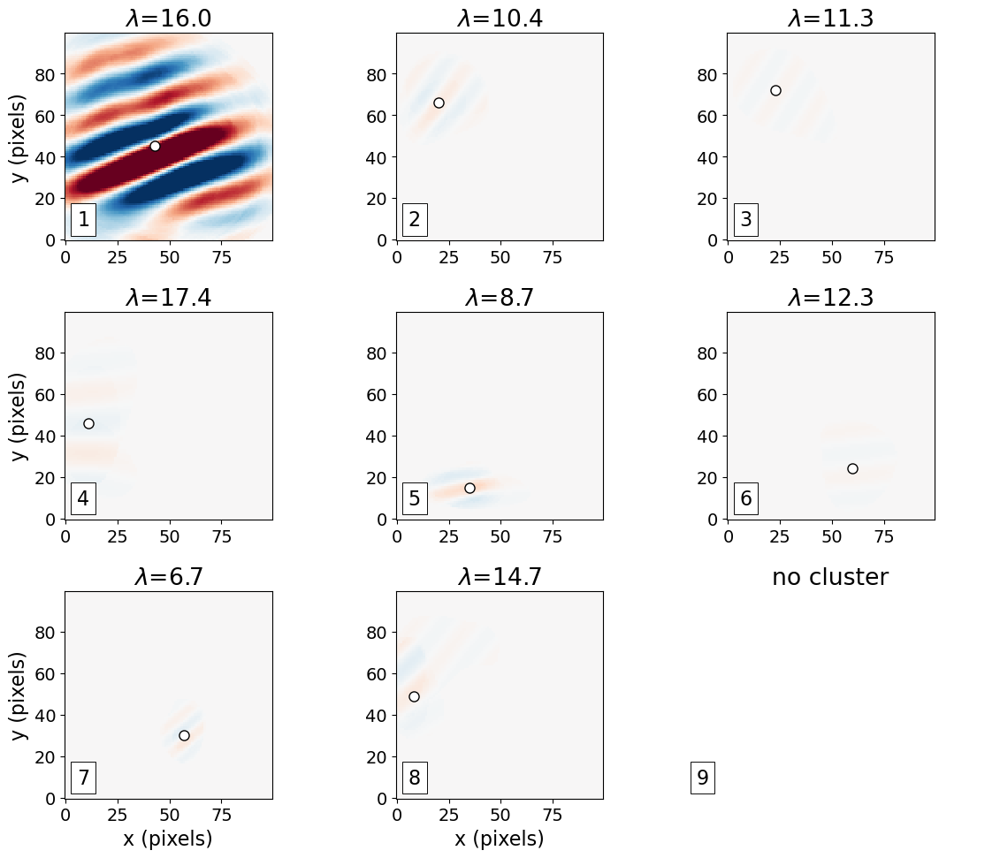

[Overlay] Cluster 0: amp=0.895, lamx=46.78, lamy=17.03, lam=16.00
[Overlay] Cluster 1: amp=0.289, lamx=13.54, lamy=16.14, lam=10.37
[Overlay] Cluster 2: amp=0.281, lamx=13.06, lamy=22.63, lam=11.31
[Overlay] Cluster 3: amp=0.274, lamx=284949484778667392.00, lamy=17.45, lam=17.45
[Overlay] Cluster 4: amp=0.261, lamx=50.24, lamy=8.86, lam=8.72
[Overlay] Cluster 5: amp=0.256, lamx=201489712982608608.00, lamy=12.34, lam=12.34
[Overlay] Cluster 6: amp=0.255, lamx=10.47, lamy=8.78, lam=6.73
[Overlay] Cluster 7: amp=0.252, lamx=22.83, lamy=19.15, lam=14.67


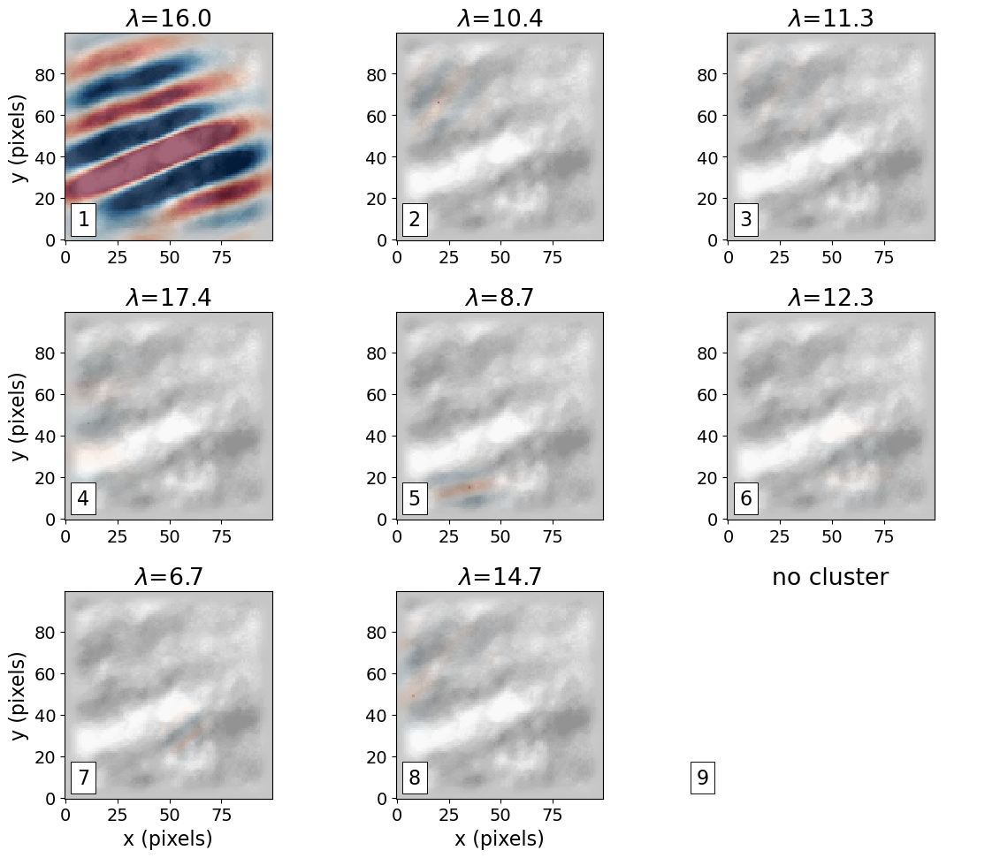

In [1]:
# Full TIFF -> ROI -> background removal -> wavelet clusters
#
# Produces:
#   1) Full TIFF preview (mean ± 0.5 sigma) with ROI rectangle
#   2) 4-panel background figure:
#        - original (median-sub)
#        - background (plane + first Fourier)
#        - remaining
#        - remaining with edge taper, spikes removed (if enabled)
#   3) Wavelet decomposition summary (utils.plot_decomposition2d)
#   4) FOV wavelet spectrum (orientation vs wavelength)
#   5) 9 standalone wavelet clusters (reconstructed fields)
#   6) 9 overlay clusters on top of the tapered remaining field (spikes removed)

from __future__ import annotations
from typing import Tuple, Optional

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tifffile as tiff

from scipy.ndimage import median_filter
from juwavelet import transform, utils, plot_utils

# --------------------------
# User params
# --------------------------
TIFF_PATH = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Jan02-03\BandOH_caun0602.tif"

# ROI (pixel slices) for analysis. Set to None to use full image.
X_SLICE: Optional[slice] = slice(20, 120) 
Y_SLICE: Optional[slice] = slice(120, 220)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5

# Preprocessing / background
REMOVE_TREND = True         # include 2D plane in "background"
STANDARDIZE = True          # z-score like scaling before CWT
GAUSS_BLUR_SIGMA = 0        # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10      # width of tapered region near each edge (pixels)

# Despike options (applied after tapering, before CWT)
APPLY_DESPIKE = True
DESPIKE_SIZE = 5            # median window size (odd integer)
DESPIKE_K = 2.0             # threshold in local "sigma" units

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# Cluster identification parameters
CLUSTER_MIN_AMP = 0.25      # min_amp for identify_cluster2d
CLUSTER_THR = 0.2           # thr for identify_cluster2d

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})


# --------------------------
# Helpers
# --------------------------
def load_tiff(
    path: str,
) -> np.ndarray:
    """Load single-frame 2D TIFF as float32 array."""
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")
    Z = np.asarray(img, dtype=np.float32)
    med = float(np.median(Z))
    Z = np.nan_to_num(Z, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return Z


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"


def despike_local_sigma(
    Z: np.ndarray,
    size: int = 3,
    k: float = 5.0,
) -> np.ndarray:
    """
    Replace pixels that deviate too much from a local median.

    Parameters
    ----------
    Z : 2D array
    size : int
        Window size for local median (3, 5, ...)
    k : float
        Threshold in units of local MAD (~sigma). Larger = more tolerant.

    Returns
    -------
    2D array, same shape as Z
    """
    Z = np.asarray(Z, float)
    med = median_filter(Z, size=size)
    mad = median_filter(np.abs(Z - med), size=size)
    mad = np.where(mad == 0, np.nan, mad)

    mask_spike = np.abs(Z - med) > k * mad

    Z_clean = Z.copy()
    Z_clean[mask_spike] = med[mask_spike]
    return Z_clean


# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Main pipeline
# --------------------------
def run_pipeline():
    # 1) Load full TIFF
    full = load_tiff(TIFF_PATH)
    ny_full, nx_full = full.shape
    x_full = np.arange(nx_full, dtype=float)
    y_full = np.arange(ny_full, dtype=float)

    # 2) Compute mean/std once on the full image, use ±0.5σ everywhere
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    print(f"[Full] mean: {center:.2f}")
    print(f"[Full] sigma: {sigma:.2f}")
    print(f"[Full] Clip range: [{lo:.2f}, {hi:.2f}] = mean ± {k:.2f}·sigma")

    # 3) Full-image preview with that same range, and ROI rectangle
    preview = full.astype(float)
    disp_prev = np.clip(preview, lo, hi)

    vals_full = disp_prev.ravel()
    if vals_full.size > 0:
        print(f"[Full] Count: {vals_full.size}")
        print(f"[Full] Min/max after clip: {np.nanmin(vals_full):.2f} / {np.nanmax(vals_full):.2f}")
        p5f, p50f, p95f = np.nanpercentile(vals_full, [5, 50, 95])
        print(f"[Full] Percentiles 5/50/95 (clipped): {p5f:.2f} / {p50f:.2f} / {p95f:.2f}")
    else:
        print("[Full] Warning: no pixels?")

    # Flip y for display
    y_full_flip = y_full[::-1]

    fig_prev, ax_prev = plt.subplots()
    im_prev = ax_prev.pcolormesh(
        x_full,
        y_full_flip,
        disp_prev,
        shading="auto",
        cmap="gray",
        vmin=lo,
        vmax=hi,
    )
    cb_prev = fig_prev.colorbar(im_prev, ax=ax_prev, fraction=0.046, pad=0.04)
    cb_prev.set_label("Intensity (a.u.)")
    ax_prev.set_xlabel("x (pixels)")
    ax_prev.set_ylabel("y (pixels)")
    ax_prev.set_title(f"Full TIFF clipped to mean ± {k:.2f}σ\ncenter={center:.1f}, σ={sigma:.1f}")
    ax_prev.set_aspect("equal", adjustable="box")

    # ROI rectangle in full-image coordinates
    ysl_full = Y_SLICE if Y_SLICE is not None else slice(0, ny_full)
    xsl_full = X_SLICE if X_SLICE is not None else slice(0, nx_full)

    x0 = 0 if xsl_full.start is None else xsl_full.start
    x1 = nx_full if xsl_full.stop is None else xsl_full.stop
    y0 = 0 if ysl_full.start is None else ysl_full.start
    y1 = ny_full if ysl_full.stop is None else ysl_full.stop

    # Map to flipped-y display coords: [y0, y1) -> [ny_full - y1, ny_full - y0)
    y0_disp = ny_full - y1
    y1_disp = ny_full - y0

    rect = patches.Rectangle(
        (x0, y0_disp),
        x1 - x0,
        y1_disp - y0_disp,
        linewidth=2,
        edgecolor="red",
        facecolor="none",
    )
    ax_prev.add_patch(rect)

    plt.tight_layout()
    plt.show(fig_prev)

    # 4) Clip to ROI
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl].astype(float)
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flip y for display

    print(f"[ROI] shape: {raw.shape}")

    # 5) Clip ROI values to [lo, hi]
    proc0 = np.clip(raw, lo, hi)

    vals_roi = proc0.ravel()
    if vals_roi.size > 0:
        print(f"[ROI] Count: {vals_roi.size}")
        print(f"[ROI] Min/max after clip: {np.nanmin(vals_roi):.2f} / {np.nanmax(vals_roi):.2f}")
        p5r, p50r, p95r = np.nanpercentile(vals_roi, [5, 50, 95])
        print(f"[ROI] Percentiles 5/50/95 (clipped): {p5r:.2f} / {p50r:.2f} / {p95r:.2f}")
    else:
        print("[ROI] Warning: no pixels?")

    # 6) Background separation: plane + first Fourier
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # 7) Apply edge taper on remaining field (for CWT and plotting)
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Remove spikes AFTER tapering (optional)
    if APPLY_DESPIKE:
        remaining_tapered_clean = despike_local_sigma(
            remaining_tapered, size=DESPIKE_SIZE, k=DESPIKE_K
        )
    else:
        remaining_tapered_clean = remaining_tapered

    # Centered versions for plotting
    med = np.nanmedian(proc0)
    orig_c = proc0 - med
    bg_c = background - med
    rem_c = remaining
    rem_tapered_c = remaining_tapered_clean

    # Global color scale for 4-panel
    stacked = np.concatenate([
        orig_c.ravel(),
        bg_c.ravel(),
        rem_c.ravel(),
        rem_tapered_c.ravel(),
    ])
    p_low, p_high = np.nanpercentile(stacked, [1, 99])
    vmax = max(abs(p_low), abs(p_high))
    if vmax == 0 or not np.isfinite(vmax):
        vmax = 1.0
    vmin = -vmax

    # 8) 4-panel background figure
    fig_bg, axs_bg = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
    axes_bg_flat = axs_bg.flatten()

    imgs_bg = [
        (orig_c, "Original (median-sub, clipped)"),
        (bg_c, "Background (plane + first Fourier)"),
        (rem_c, "Remaining = original - background"),
        (rem_tapered_c, f"Remaining with edge taper (spikes removed)"),
    ]

    im_bg = None
    for ax, (Z, title) in zip(axes_bg_flat, imgs_bg):
        im_bg = ax.pcolormesh(
            x1d,
            y1d,
            Z,
            shading="auto",
            cmap="RdBu_r",
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(title)
        ax.set_xlabel("x (pixels)")
        ax.set_ylabel("y (pixels)")
        ax.set_aspect("equal")

    cbar_bg = fig_bg.colorbar(im_bg, ax=axs_bg, orientation="vertical",
                              fraction=0.04, pad=0.02)
    cbar_bg.set_label("Intensity (a.u.)")

    plt.show(fig_bg)

    # 9) Preprocess for CWT only (standardize + blur) on tapered + de-spiked field
    proc = remaining_tapered_clean.copy()
    if STANDARDIZE:
        m_proc = np.median(proc)
        proc = proc - m_proc
        s_proc = np.std(proc)
        proc = proc / s_proc if s_proc > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # 10) Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(
        cwt, min_amp=CLUSTER_MIN_AMP, thr=CLUSTER_THR
    )

    decomposition = cwt["decomposition"]
    orig_decomp = decomposition.copy()

    # 11) Overview CWT plot
    cmap_cwt = matplotlib.cm.turbo
    norm_cwt = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap_cwt.N
    )
    fig_cwt, _ = utils.plot_decomposition2d(cwt, redux_s=4, redux_t=2,
                                            cmap=cmap_cwt, norm=norm_cwt)
    plt.show(fig_cwt)

    # 12) FOV wavelet spectrum
    plot_utils.plot_fov_wavelet_spectrum(cwt, stat="max")

    # Background image for overlays: tapered remaining (spikes removed), centered
    bg_tapered_centered = remaining_tapered_clean - np.median(remaining_tapered_clean)
    bg_low, bg_high = np.nanpercentile(bg_tapered_centered, [2, 98])
    bg_vmax = max(abs(bg_low), abs(bg_high))
    if not np.isfinite(bg_vmax) or bg_vmax == 0:
        bg_vmax = 1.0
    bg_vmin = -bg_vmax

    # --------------------------
    # Figure 1: 9 standalone clusters
    # --------------------------
    fig1, axs1 = plt.subplots(3, 3, figsize=(12, 10))
    axes1_flat = axs1.flatten()

    opts_img_cluster = {"cmap": "RdBu_r", "vmin": -0.8, "vmax": 0.8, "rasterized": True}

    n_clusters = len(amps) if amps is not None else 0

    if n_clusters == 0:
        for ax in axes1_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        for ax, kcl in zip(axes1_flat, biggest):
            # Reconstruct cluster
            decomposition[:] = orig_decomp
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.pcolormesh(x1d, y1d, rec_centered, **opts_img_cluster)
            ax.set_aspect("equal", adjustable="box")
            
            # Mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[s_idx, t_idx].argmax(), decomposition[0, 0].shape
            )
            ax.plot(
                x1d[max_idx[0]],
                y1d[max_idx[1]],
                "o", color="w", mec="k", ms=8,
            )
            
            print(
                f"[Clusters-only] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # Hide unused axes
        for ax in axes1_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    for ax in axs1[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs1[:, 0]:
        ax.set_ylabel("y (pixels)")

    number_box = {
        "boxstyle": "square",
        "lw": 0.67,
        "facecolor": "white",
        "edgecolor": "black",
    }
    for i, ax in enumerate(axes1_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig1.tight_layout()
    plt.show(fig1)

    # --------------------------
    # Figure 2: 9 overlays (cluster on tapered field)
    # --------------------------
    fig2, axs2 = plt.subplots(3, 3, figsize=(12, 10))
    axes2_flat = axs2.flatten()

    if n_clusters == 0:
        for ax in axes2_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        cl_vmin, cl_vmax = -0.6, 0.6

        for ax, kcl in zip(axes2_flat, biggest):
            # Background: tapered remaining field (centered, spikes removed), grayscale
            ax.pcolormesh(
                x1d,
                y1d,
                bg_tapered_centered,
                shading="auto",
                cmap="gray",
                vmin=bg_vmin,
                vmax=bg_vmax,
            )

            # Reconstruct cluster again
            decomposition[:] = orig_decomp
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.pcolormesh(
                x1d,
                y1d,
                rec_centered,
                shading="auto",
                cmap="RdBu_r",
                vmin=cl_vmin,
                vmax=cl_vmax,
                alpha=0.6,
            )

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Overlay] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # Hide unused axes
        for ax in axes2_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    for ax in axs2[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs2[:, 0]:
        ax.set_ylabel("y (pixels)")

    for i, ax in enumerate(axes2_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig2.tight_layout()
    plt.show(fig2)


# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


## Save Crest Relative Amplitude Evolution

Found 11 TIFF files in C:\Users\domin\juwavelet\examples\Waves For Anh\BLO6326_602
Overlay output directory: C:\Users\domin\juwavelet\examples\Waves For Anh\BLO6326_602\overlays_crests_phase


C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


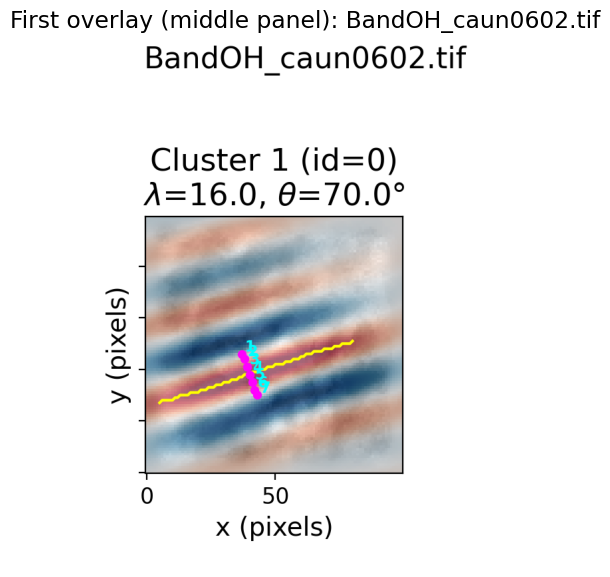

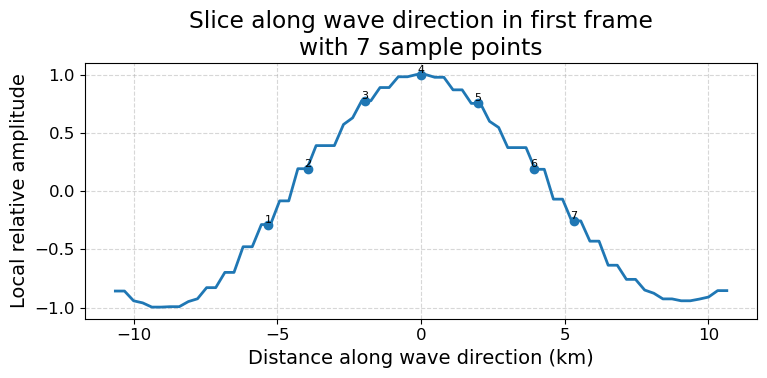

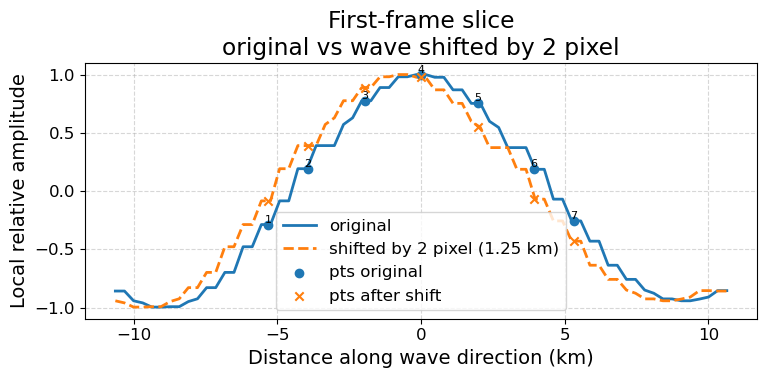

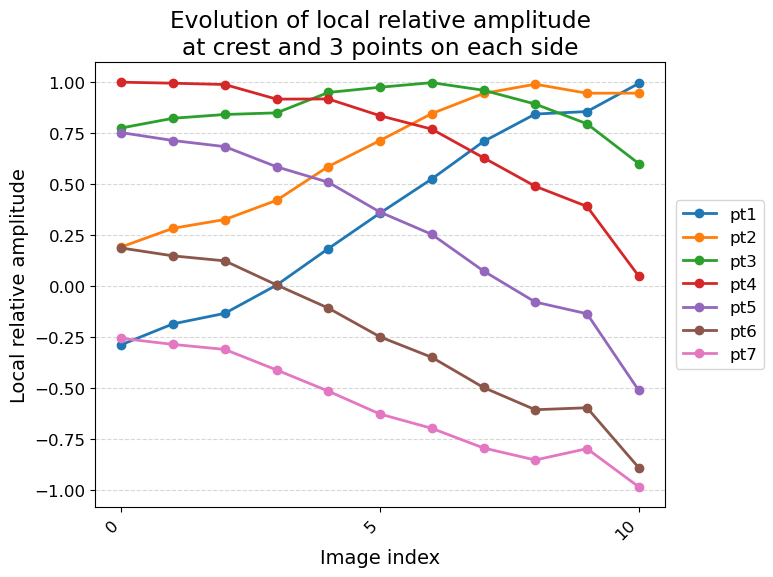

In [3]:
# %%
# Full (sliced) TIFF -> ROI -> background removal -> wavelet clusters
# (batch version, with crest marker + ridge line + relative-amplitude panel)
#
# For each TIFF in TIFF_DIR, this script:
#   - Uses ROI (X_SLICE, Y_SLICE) from each TIFF (or full image if None)
#   - Removes a 2D plane + first Fourier mode as "background"
#   - Applies optional edge taper
#   - Runs juwavelet 2D CWT
#   - Applies band-pass + angle filters before clustering
#   - Identifies clusters on the filtered decomposition
#   - Reconstructs the strongest cluster
#   - Saves a figure with 3 columns:
#         LEFT:   background (remaining_tapered_clean, centered)
#         MIDDLE: background + cluster reconstruction overlay
#                  + first crest marker + 7 sample points
#                  + ridge line (skeleton) along the bright band
#         RIGHT:  local relative amplitude:
#                  for each pixel, neighborhood radius λ/2 (km),
#                  local max -> +1, local min -> -1, clipped to [-1, 1].
#
# Tracking / evolution (same logic as PNG cell):
#   - Uses ONLY the first crest from the FIRST TIFF (cluster 0)
#   - From that crest, defines 7 points along the wave direction
#     in BOTH directions, including the crest:
#         offsets = [-3, -2, -1, 0, +1, +2, +3] steps
#   - For each TIFF, samples local relative amplitude at those 7 pixels
#   - Saves amplitude evolution to:
#         crest_relative_amplitude_evolution.npy
#         crest_relative_amplitude_evolution.csv
#   - Plots relative amplitude vs image index for the 7 points.
#   - After the first overlay image, also shows a 1D slice along the
#     wave direction in the first frame, with the 7 points marked,
#     and a comparison where the wave is shifted by 2 pixels.

from __future__ import annotations
from typing import Tuple, Optional, List

from pathlib import Path
import csv

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tifffile as tiff

from scipy.ndimage import median_filter, maximum_filter, minimum_filter
from scipy import ndimage
from skimage import morphology

from juwavelet import transform, utils

def _silent_print(*args, **kwargs):
    pass

# Silence juwavelet's internal prints (as in PNG cell)
utils.print = _silent_print

# --------------------------
# User params
# --------------------------

# Folder with input TIFFs
TIFF_DIR = r"C:\Users\domin\juwavelet\examples\Waves For Anh\BLO6326_602"

# Optional explicit output folder for overlays
# If None, a subfolder "overlays_crests_phase" will be created inside TIFF_DIR
OVERLAY_DIR: Optional[str] = None

# ROI (pixel slices) for analysis. Set to None to use full image.
X_SLICE: Optional[slice] = slice(20, 120) 
Y_SLICE: Optional[slice] = slice(120, 220)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5

# Preprocessing / background
REMOVE_TREND = True         # include 2D plane in "background"
STANDARDIZE = True          # z-score like scaling before CWT
GAUSS_BLUR_SIGMA = 0        # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10      # width of tapered region near each edge (pixels)

# Despike options (you can set to False if you want EXACT PNG behaviour)
APPLY_DESPIKE = True
DESPIKE_SIZE = 5            # median window size (odd integer)
DESPIKE_K = 2.0             # threshold in local "sigma" units

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# Cluster identification parameters
CLUSTER_MIN_AMP = 0.25      # min_amp for identify_cluster2d
CLUSTER_THR = 0.1           # thr for identify_cluster2d

# Band-pass filter on effective wavelength λ (km)
ENABLE_BANDPASS = True
BANDPASS_LMIN_KM = 16.0
BANDPASS_LMAX_KM = 32.0

# Angle filter on wave-vector direction (degrees)
ENABLE_ANGLE_FILTER = True
ANGLE_MIN_DEG = 60.0
ANGLE_MAX_DEG = 90.0

# Cluster plotting controls
MAX_CLUSTERS = 1             # maximum number of clusters to show per TIFF

# Crest detection parameters (only 1 crest, like PNG script)
CREST_NEIGHBORHOOD = 7
CREST_MIN_RELAMP = 0.2
CRESTS_PER_CLUSTER = 1       # ONLY FIRST CREST

# Tracking params (same as PNG script)
N_SAMPLE_POINTS = 7          # crest + 3 on each side

# Plot controls
SHOW_FIGS = False
SAVE_OVERLAY = True

# Verbosity
VERBOSE = False               # Set to True if you want prints

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 14,
    "font.size": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,
    "figure.figsize": [12, 8],
})

# --------------------------
# Small logger
# --------------------------
def log(msg: str) -> None:
    if VERBOSE:
        print(msg)

# --------------------------
# Helpers
# --------------------------
def load_tiff(
    path: str,
) -> np.ndarray:
    """Load single-frame 2D TIFF as float32 array."""
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")
    Z = np.asarray(img, dtype=np.float32)
    med = float(np.median(Z))
    Z = np.nan_to_num(Z, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return Z


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"


def despike_local_sigma(
    Z: np.ndarray,
    size: int = 3,
    k: float = 5.0,
) -> np.ndarray:
    """
    Replace pixels that deviate too much from a local median.
    """
    Z = np.asarray(Z, float)
    med = median_filter(Z, size=size)
    mad = median_filter(np.abs(Z - med), size=size)
    mad = np.where(mad == 0, np.nan, mad)

    mask_spike = np.abs(Z - med) > k * mad

    Z_clean = Z.copy()
    Z_clean[mask_spike] = med[mask_spike]
    return Z_clean


# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Helpers for λ and angle
# --------------------------
def compute_lambda_theta_fields(cwt: dict) -> Tuple[np.ndarray, np.ndarray]:
    """
    Compute effective wavelength λ (km) and angle θ (deg) for all (s, t).

    λ is from λx, λy via: 1/λ² = 1/λx² + 1/λy²
    θ is from kx, ky via atan2(ky, kx), wrapped to [0, 180).
    """
    lamx = np.asarray(cwt["wavelength_x"], float)
    lamy = np.asarray(cwt["wavelength_y"], float)

    with np.errstate(divide="ignore", invalid="ignore"):
        inv_lamx2 = np.where(np.isfinite(lamx) & (lamx != 0.0), 1.0 / (lamx**2), 0.0)
        inv_lamy2 = np.where(np.isfinite(lamy) & (lamy != 0.0), 1.0 / (lamy**2), 0.0)
        inv2 = inv_lamx2 + inv_lamy2
        lam_eff = np.where(inv2 > 0, 1.0 / np.sqrt(inv2), np.inf)

        # Wavevector components
        kx = np.where(np.isfinite(lamx) & (lamx != 0.0), 1.0 / lamx, 0.0)
        ky = np.where(np.isfinite(lamy) & (lamy != 0.0), 1.0 / lamy, 0.0)

        theta_deg = np.degrees(np.arctan2(ky, kx))
        theta_deg = np.mod(theta_deg, 180.0)  # [0, 180)

    return lam_eff, theta_deg


def compute_cluster_lambda_and_angle(
    cwt: dict,
    idx_s: int,
    idx_t: int,
) -> Tuple[float, float]:
    """
    Convenience for a single cluster (for logging/title).
    """
    lam_eff, theta_deg = compute_lambda_theta_fields(cwt)
    lam = float(lam_eff[idx_s, idx_t])
    theta = float(theta_deg[idx_s, idx_t])
    return lam, theta


# --------------------------
# Crest detection (only 1 crest)
# --------------------------
def find_top_crests(
    Z: np.ndarray,
    num: int = 1,
    neighborhood: int = 7,
    min_rel_amp: float = 0.2,
) -> List[Tuple[int, int, float]]:
    """
    Find up to `num` strongest local crests (positive local maxima) in Z.

    Returns a list of (iy, ix, value) sorted by descending value.
    """
    Z = np.asarray(Z, float)
    if Z.size == 0:
        return []

    max_val = np.nanmax(Z)
    if not np.isfinite(max_val) or max_val <= 0:
        return []

    neighborhood = max(int(neighborhood), 1)

    local_max = maximum_filter(Z, size=neighborhood, mode="nearest")
    mask = (Z == local_max) & (Z > 0) & (Z >= min_rel_amp * max_val)

    ys, xs = np.where(mask)
    if ys.size == 0:
        # Fallback: global max
        iy, ix = np.unravel_index(np.nanargmax(Z), Z.shape)
        return [(int(iy), int(ix), float(Z[iy, ix]))][:num]

    vals = Z[ys, xs]
    order = np.argsort(vals)[::-1]

    crests: List[Tuple[int, int, float]] = []
    for idx in order[:num]:
        iy = int(ys[idx])
        ix = int(xs[idx])
        crests.append((iy, ix, float(vals[idx])))

    return crests


# --------------------------
# Ridge line (skeleton) along the bright band
# --------------------------
def compute_ridge_mask(
    Z: np.ndarray,
    level_frac: float = 0.6,
) -> np.ndarray:
    """
    Compute a 1-pixel-wide ridge mask for the dominant bright band in Z.
    """
    Z = np.asarray(Z, float)
    if Z.size == 0:
        return np.zeros_like(Z, dtype=bool)

    max_val = np.nanmax(Z)
    if not np.isfinite(max_val) or max_val <= 0:
        return np.zeros_like(Z, dtype=bool)

    level = level_frac * max_val
    mask = Z >= level
    if not np.any(mask):
        return np.zeros_like(Z, dtype=bool)

    labels, num = ndimage.label(mask)
    if num == 0:
        return np.zeros_like(Z, dtype=bool)

    iy_max, ix_max = np.unravel_index(np.nanargmax(Z), Z.shape)
    label_peak = labels[iy_max, ix_max]
    if label_peak == 0:
        return np.zeros_like(Z, dtype=bool)

    peak_comp = labels == label_peak
    ridge = morphology.skeletonize(peak_comp)
    return ridge


# --------------------------
# Single-file pipeline
# --------------------------
def run_pipeline_for_file(
    tiff_path: Path,
    overlay_dir: Path,
    show_figs: bool = False,
    save_overlay: bool = True,
    crest_iy: Optional[np.ndarray] = None,  # actually: sample_iy (7 points)
    crest_ix: Optional[np.ndarray] = None,  # actually: sample_ix (7 points)
    init_crests_from_this_file: bool = False,
) -> Tuple[Optional[np.ndarray], Optional[np.ndarray], Optional[np.ndarray], Optional[dict]]:
    """
    Run the full pipeline on a single TIFF and optionally save the overlay figure.

    Returns
    -------
    vals_on_crests : 1D array of LOCAL RELATIVE AMPLITUDE at the 7 sample
                     pixels for this TIFF (None if samples not defined)
    crest_iy, crest_ix : 1D arrays of sample indices (row, col) from first TIFF
    first_frame_info : dict with info for slice plot (only for first TIFF), or None
    """
    log(f"\n=== Processing {tiff_path.name} ===")
    full = load_tiff(str(tiff_path))
    ny_full, nx_full = full.shape
    x_full = np.arange(nx_full, dtype=float)
    y_full = np.arange(ny_full, dtype=float)

    first_frame_info: Optional[dict] = None

    # Compute mean/std once on the full image, use ±0.5σ for clipping in preview / ROI
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    log(f"[Full] mean={center:.2f}, sigma={sigma:.2f}, clip=[{lo:.2f}, {hi:.2f}]")

    # Full preview (optional)
    if show_figs:
        preview = np.clip(full.astype(float), lo, hi)
        vals_full = preview.ravel()
        p5f, p50f, p95f = np.nanpercentile(vals_full, [5, 50, 95])
        log(f"[Full] Percentiles 5/50/95 (clipped): {p5f:.2f} / {p50f:.2f} / {p95f:.2f}")

        y_full_flip = y_full[::-1]

        fig_prev, ax_prev = plt.subplots()
        im_prev = ax_prev.pcolormesh(
            x_full,
            y_full_flip,
            preview,
            shading="auto",
            cmap="gray",
            vmin=lo,
            vmax=hi,
        )
        cb_prev = fig_prev.colorbar(im_prev, ax=ax_prev, fraction=0.046, pad=0.04)
        cb_prev.set_label("Intensity (a.u.)")
        ax_prev.set_xlabel("x (pixels)")
        ax_prev.set_ylabel("y (pixels)")
        ax_prev.set_title(f"{tiff_path.name}\nFull TIFF clipped to mean ± {k:.2f}σ")
        ax_prev.set_aspect("equal", adjustable="box")

        # ROI rectangle
        ysl_full = Y_SLICE if Y_SLICE is not None else slice(0, ny_full)
        xsl_full = X_SLICE if X_SLICE is not None else slice(0, nx_full)

        x0 = 0 if xsl_full.start is None else xsl_full.start
        x1 = nx_full if xsl_full.stop is None else xsl_full.stop
        y0 = 0 if ysl_full.start is None else ysl_full.start
        y1 = ny_full if ysl_full.stop is None else ysl_full.stop

        y0_disp = ny_full - y1
        y1_disp = ny_full - y0

        rect = patches.Rectangle(
            (x0, y0_disp),
            x1 - x0,
            y1_disp - y0_disp,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        ax_prev.add_patch(rect)

        plt.tight_layout()
        plt.show()

    # ROI
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl].astype(float)
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flipped for display

    log(f"[ROI] shape: {raw.shape}")

    # Clip ROI to mean ± 0.5σ
    proc0 = np.clip(raw, lo, hi)

    # Background separation: plane + first Fourier
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # Edge taper
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Despike
    if APPLY_DESPIKE:
        remaining_tapered_clean = despike_local_sigma(
            remaining_tapered, size=DESPIKE_SIZE, k=DESPIKE_K
        )
    else:
        remaining_tapered_clean = remaining_tapered

    # Centered versions for plotting
    med = np.nanmedian(proc0)
    orig_c = proc0 - med
    bg_c = background - med
    rem_c = remaining
    rem_tapered_c = remaining_tapered_clean

    # Global color scale for background figure
    stacked = np.concatenate([
        orig_c.ravel(),
        bg_c.ravel(),
        rem_c.ravel(),
        rem_tapered_c.ravel(),
    ])
    p_low, p_high = np.nanpercentile(stacked, [1, 99])
    vmax = max(abs(p_low), abs(p_high))
    if vmax == 0 or not np.isfinite(vmax):
        vmax = 1.0
    vmin = -vmax

    # Optional background figure
    if show_figs:
        fig_bg, axs_bg = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
        axes_bg_flat = axs_bg.flatten()

        imgs_bg = [
            (orig_c, "Original (median-sub, clipped)"),
            (bg_c, "Background (plane + first Fourier)"),
            (rem_c, "Remaining = original - background"),
            (rem_tapered_c, "Remaining with edge taper"),
        ]

        im_bg = None
        for ax, (Z, title) in zip(axes_bg_flat, imgs_bg):
            im_bg = ax.pcolormesh(
                x1d,
                y1d,
                Z,
                shading="auto",
                cmap="RdBu_r",
                vmin=vmin,
                vmax=vmax,
            )
            ax.set_title(title)
            ax.set_xlabel("x (pixels)")
            ax.set_ylabel("y (pixels)")
            ax.set_aspect("equal")

        cbar_bg = fig_bg.colorbar(im_bg, ax=axs_bg, orientation="vertical",
                                  fraction=0.04, pad=0.02)
        cbar_bg.set_label("Intensity (a.u.)")

        plt.show()

    # Preprocess for CWT (standardize + blur)
    proc = remaining_tapered_clean.copy()
    if STANDARDIZE:
        m_proc = np.median(proc)
        proc = proc - m_proc
        s_proc = np.std(proc)
        proc = proc / s_proc if s_proc > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # --------------------------
    # Apply band-pass & angle filters BEFORE clustering
    # --------------------------
    decomposition = cwt["decomposition"]
    ns, nt, nx_cwt, ny_cwt = decomposition.shape

    lam_eff, theta_deg = compute_lambda_theta_fields(cwt)

    mask_keep = np.ones_like(lam_eff, dtype=bool)

    if ENABLE_BANDPASS:
        mask_band = (
            np.isfinite(lam_eff)
            & (lam_eff >= BANDPASS_LMIN_KM)
            & (lam_eff <= BANDPASS_LMAX_KM)
        )
        mask_keep &= mask_band

    if ENABLE_ANGLE_FILTER:
        mask_angle = (
            np.isfinite(theta_deg)
            & (theta_deg >= ANGLE_MIN_DEG)
            & (theta_deg <= ANGLE_MAX_DEG)
        )
        mask_keep &= mask_angle

    n_total_modes = lam_eff.size
    n_keep_modes = int(mask_keep.sum())
    log(f"[Filter] Modes kept: {n_keep_modes}/{n_total_modes}")

    # Broadcast mask over spatial dims and zero-out disallowed modes
    mask4 = mask_keep[:, :, None, None].astype(decomposition.dtype)
    decomposition *= mask4

    # --------------------------
    # Identify clusters
    # --------------------------
    amps, idxs, iwave = utils.identify_cluster2d(
        cwt, min_amp=CLUSTER_MIN_AMP, thr=CLUSTER_THR
    )

    orig_decomp = decomposition.copy()

    # Background for overlays
    bg_tapered_centered = remaining_tapered_clean - np.median(remaining_tapered_clean)
    bg_low, bg_high = np.nanpercentile(bg_tapered_centered, [2, 98])
    bg_vmax = max(abs(bg_low), abs(bg_high))
    if not np.isfinite(bg_vmax) or bg_vmax == 0:
        bg_vmax = 1.0
    bg_vmin = -bg_vmax

    n_clusters = len(amps) if amps is not None else 0
    log(f"[Clusters] n_clusters (after filters) = {n_clusters}")

    crest_iy_out = crest_iy
    crest_ix_out = crest_ix
    vals_on_crests: Optional[np.ndarray] = None

    if n_clusters == 0:
        log("[Clusters] No cluster found after filters; nothing to overlay.")
        fig_empty, ax = plt.subplots(figsize=(6, 4))
        ax.pcolormesh(
            x1d,
            y1d,
            bg_tapered_centered,
            shading="auto",
            cmap="gray",
            vmin=bg_vmin,
            vmax=bg_vmax,
        )
        ax.set_aspect("equal", adjustable="box")
        ax.set_xlabel("x (pixels)")
        ax.set_ylabel("y (pixels)")
        ax.set_title("No clusters after filters")
        fig_empty.tight_layout()

        if save_overlay:
            overlay_dir.mkdir(parents=True, exist_ok=True)
            out_path = overlay_dir / f"{tiff_path.stem}_overlay_clusters_crests_phase.png"
            fig_empty.savefig(out_path, dpi=200)
            log(f"[Save] Overlay saved to: {out_path}")

        if show_figs:
            plt.show(fig_empty)
        else:
            plt.close(fig_empty)

        return None, crest_iy_out, crest_ix_out, None

    # Sort clusters by amplitude and limit to MAX_CLUSTERS
    order = np.argsort(amps)[::-1]
    n_show = min(n_clusters, MAX_CLUSTERS)

    # Figure: one row per cluster, 3 columns
    fig, axes = plt.subplots(
        n_show, 3,
        figsize=(15, 4 * n_show),
        sharex=True,
        sharey=True,
    )
    axes = np.atleast_2d(axes)

    for j in range(n_show):
        kcl = int(order[j])
        ax_bg = axes[j, 0]
        ax_ov = axes[j, 1]
        ax_ph = axes[j, 2]

        # LEFT: background
        ax_bg.pcolormesh(
            x1d,
            y1d,
            bg_tapered_centered,
            shading="auto",
            cmap="gray",
            vmin=bg_vmin,
            vmax=bg_vmax,
        )
        ax_bg.set_title("Background (remaining_tapered_clean)")
        ax_bg.set_aspect("equal", adjustable="box")
        ax_bg.set_xlabel("x (pixels)")
        ax_bg.set_ylabel("y (pixels)")

        # MIDDLE: overlay (background + reconstruction)
        decomposition[:] = orig_decomp
        decomposition[iwave != kcl] = 0
        rec = transform.reconstruct2d(cwt)  # (nx, ny)
        rec_centered = rec.T - np.median(rec)  # (ny, nx)
        ny_img, nx_img = rec_centered.shape

        ax_ov.pcolormesh(
            x1d,
            y1d,
            bg_tapered_centered,
            shading="auto",
            cmap="gray",
            vmin=bg_vmin,
            vmax=bg_vmax,
        )

        cl_vmin, cl_vmax = -0.6, 0.6
        ax_ov.pcolormesh(
            x1d,
            y1d,
            rec_centered,
            shading="auto",
            cmap="RdBu_r",
            vmin=cl_vmin,
            vmax=cl_vmax,
            alpha=0.6,
        )

        # Ridge line
        ridge_mask = compute_ridge_mask(rec_centered, level_frac=0.6)
        if np.any(ridge_mask):
            ys_ridge, xs_ridge = np.where(ridge_mask)
            order_r = np.argsort(xs_ridge)
            xs_sorted = xs_ridge[order_r].astype(float)
            ys_sorted = ys_ridge[order_r].astype(float)
            x_disp_r = xs_sorted
            y_disp_r = ny_img - 1 - ys_sorted
            ax_ov.plot(x_disp_r, y_disp_r, linewidth=1.5, color="yellow")
        else:
            log(f"[Skeleton] No ridge found for cluster {kcl}")

        # Wavelength & angle (for title and direction)
        s_idx = int(idxs[kcl][0])
        t_idx = int(idxs[kcl][1])
        lam_best, theta_best = compute_cluster_lambda_and_angle(cwt, s_idx, t_idx)
        title_str = (
            f"Cluster {j+1} (id={kcl})\n"
            rf"$\lambda$={_fmt(lam_best)}, $\theta$={theta_best:.1f}°"
        )
        ax_ov.set_title(title_str)
        ax_ov.set_aspect("equal", adjustable="box")

        # RIGHT: local relative amplitude
        if np.isfinite(lam_best) and lam_best > 0:
            radius_km = lam_best / 2.0
            radius_pix = max(int(np.round(radius_km / DX)), 1)
        else:
            radius_pix = 1

        win_size = 2 * radius_pix + 1

        local_max = maximum_filter(rec_centered, size=win_size, mode="nearest")
        local_min = minimum_filter(rec_centered, size=win_size, mode="nearest")
        denom = local_max - local_min
        denom_safe = np.where(denom != 0, denom, np.nan)

        rel_amp = -1.0 + 2.0 * (rec_centered - local_min) / denom_safe
        rel_amp = np.where(np.isfinite(rel_amp), rel_amp, 0.0)
        rel_amp = np.clip(rel_amp, -1.0, 1.0)

        mask_cluster_xy = np.any(iwave == kcl, axis=(0, 1))   # (nx, ny)
        mask_cluster_img = mask_cluster_xy.T                  # (ny, nx)
        rel_amp_cluster = np.where(mask_cluster_img, rel_amp, np.nan)

        im_rel = ax_ph.pcolormesh(
            x1d,
            y1d,
            rel_amp_cluster,
            shading="auto",
            cmap="RdBu_r",
            vmin=-1.0,
            vmax=1.0,
        )
        ax_ph.set_title(r"Local relative amplitude (radius $\lambda/2$)")
        ax_ph.set_aspect("equal", adjustable="box")
        ax_ph.set_xlabel("x (pixels)")
        ax_ph.set_ylabel("y (pixels)")

        cbar_ph = fig.colorbar(
            im_rel,
            ax=ax_ph,
            fraction=0.046,
            pad=0.04,
        )
        cbar_ph.set_label("Relative amplitude")

        # Find ONLY 1 crest for visualization / tracking
        crests = find_top_crests(
            rec_centered,
            num=CRESTS_PER_CLUSTER,
            neighborhood=CREST_NEIGHBORHOOD,
            min_rel_amp=CREST_MIN_RELAMP,
        )

        ax_ov.set_xlabel("x (pixels)")
        ax_ov.set_ylabel("y (pixels)")

        log(
            f"[Cluster {kcl}] amp={amps[kcl]:.3f}, "
            f"lam={_fmt(lam_best)}, theta={theta_best:.1f}°, "
            f"crests_found={len(crests)}"
        )

        # Crest-based tracking (first cluster only)
        if j == 0:
            # First TIFF: define 7 sample points along wave direction
            # around the FIRST crest, including crest itself.
            if init_crests_from_this_file and crest_iy_out is None and crest_ix_out is None:
                if len(crests) > 0:
                    crest0_iy, crest0_ix, _ = crests[0]
                    log(
                        f"[Crest tracking] Using crest at (iy={crest0_iy}, ix={crest0_ix}) "
                        f"to define {N_SAMPLE_POINTS} points along wave direction."
                    )

                    # Direction of wavevector (θ) in radians
                    theta_rad = np.deg2rad(theta_best)
                    # Unit vector in pixel coordinates (x right, y down)
                    ux = np.cos(theta_rad)
                    uy = np.sin(theta_rad)

                    # Step size along the direction (pixels).
                    step_pix = max(radius_pix // 4, 1)

                    # Offsets in BOTH directions, including center:
                    # [-3, -2, -1, 0, +1, +2, +3]
                    offsets = np.array(
                        [-3, -2, -1, 0, 1, 2, 3],
                        dtype=float,
                    )
                    if offsets.size != N_SAMPLE_POINTS:
                        offsets = np.linspace(-3, 3, N_SAMPLE_POINTS)

                    sample_ix = crest0_ix + np.round(step_pix * offsets * ux).astype(int)
                    sample_iy = crest0_iy + np.round(step_pix * offsets * uy).astype(int)

                    # Optional per-point shifts (set all zeros to match PNG behaviour)
                    pixel_shifts = np.array([0, 0, 0, 0, 0, 0, 0], dtype=float)
                    for idx_pt, pix_shift in enumerate(pixel_shifts):
                        dx = int(np.round(pix_shift * ux))
                        dy = int(np.round(pix_shift * uy))
                        sample_ix[idx_pt] += dx
                        sample_iy[idx_pt] += dy

                    # Clip to image bounds
                    sample_ix = np.clip(sample_ix, 0, nx_img - 1)
                    sample_iy = np.clip(sample_iy, 0, ny_img - 1)

                    crest_ix_out = sample_ix
                    crest_iy_out = sample_iy

                    log("[Crest tracking] Sample points (iy, ix):")
                    if VERBOSE:
                        for n_pt in range(N_SAMPLE_POINTS):
                            print(f"  pt{n_pt+1}: (iy={crest_iy_out[n_pt]}, ix={crest_ix_out[n_pt]})")

                    # Mark these 7 sample points as small magenta dots + cyan numbers
                    for n_pt in range(N_SAMPLE_POINTS):
                        x_disp = float(crest_ix_out[n_pt])
                        y_disp = float(ny_img - 1 - crest_iy_out[n_pt])
                        ax_ov.plot(
                            x_disp,
                            y_disp,
                            marker="o",
                            markersize=4,
                            markeredgecolor="magenta",
                            markerfacecolor="magenta",
                            markeredgewidth=0.8,
                        )
                        ax_ov.text(
                            x_disp + 1.0,
                            y_disp + 1.0,
                            f"{n_pt+1}",
                            color="cyan",
                            fontsize=8,
                            weight="bold",
                        )
                else:
                    log("[Crest tracking] No crest found in first image.")

            # Store info for first-frame slice plot
            if init_crests_from_this_file and crest_iy_out is not None and crest_ix_out is not None:
                first_frame_info = {
                    "rel_amp": rel_amp.copy(),
                    "crest_iy": crest_iy_out.copy(),
                    "crest_ix": crest_ix_out.copy(),
                }

            # Every frame: sample rel_amp at the 7 sample indices
            if crest_iy_out is not None and crest_ix_out is not None:
                if (crest_iy_out.max() < ny_img) and (crest_ix_out.max() < nx_img):
                    vals_on_crests = rel_amp[crest_iy_out, crest_ix_out]
                else:
                    log("[Crest tracking] Stored sample indices out of bounds; skipping sampling.")
                    vals_on_crests = None

    fig.suptitle(f"{tiff_path.name}", fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.96])

    if save_overlay:
        overlay_dir.mkdir(parents=True, exist_ok=True)
        out_path = overlay_dir / f"{tiff_path.stem}_overlay_clusters_crests_phase.png"
        fig.savefig(out_path, dpi=200)
        log(f"[Save] Overlay saved to: {out_path}")

    if show_figs:
        plt.show(fig)
    else:
        plt.close(fig)

    return vals_on_crests, crest_iy_out, crest_ix_out, first_frame_info


# --------------------------
# Batch driver
# --------------------------
def run_batch():
    tiff_dir = Path(TIFF_DIR)
    if OVERLAY_DIR is not None:
        overlay_dir = Path(OVERLAY_DIR)
    else:
        overlay_dir = tiff_dir / "overlays_crests_phase"

    files = sorted(list(tiff_dir.glob("*.tif")) + list(tiff_dir.glob("*.tiff")))
    if not files:
        print(f"No TIFF files found in {tiff_dir}")
        return

    log(f"Found {len(files)} TIFF files in {tiff_dir}")
    log(f"Overlay output directory: {overlay_dir}")

    print(f"Found {len(files)} TIFF files in {tiff_dir}")
    print(f"Overlay output directory: {overlay_dir}")

    crest_iy = None   # actually sample_iy
    crest_ix = None   # actually sample_ix
    crest_value_series: List[np.ndarray] = []
    frame_indices: List[int] = []   # store image indices (0..N-1 in sorted(files))
    first_frame_info: Optional[dict] = None

    for i, tiff_path in enumerate(files):
        vals_on_crests, crest_iy, crest_ix, first_info = run_pipeline_for_file(
            tiff_path=tiff_path,
            overlay_dir=overlay_dir,
            show_figs=SHOW_FIGS,
            save_overlay=SAVE_OVERLAY,
            crest_iy=crest_iy,
            crest_ix=crest_ix,
            init_crests_from_this_file=(i == 0),
        )

        if first_frame_info is None and first_info is not None:
            first_frame_info = first_info

        if vals_on_crests is not None:
            crest_value_series.append(vals_on_crests)
            frame_indices.append(i)

    # --------------------------
    # Save and plot evolution of local relative amplitude at the 7 points
    # --------------------------
    if crest_value_series:
        val_arr = np.vstack(crest_value_series)  # (n_files_used, N_SAMPLE_POINTS)
        n_files_used, n_points = val_arr.shape
        frames = np.array(frame_indices, dtype=int)

        overlay_dir.mkdir(parents=True, exist_ok=True)

        # Save as .npy
        npy_path = overlay_dir / "crest_relative_amplitude_evolution.npy"
        np.save(npy_path, val_arr)
        log(f"[Save] Relative amplitude evolution (array) saved to: {npy_path}")

        # Save as CSV with frame indices (same structure as PNG version)
        csv_path = overlay_dir / "crest_relative_amplitude_evolution.csv"
        with open(csv_path, "w", newline="") as f:
            writer = csv.writer(f)
            header = ["image_index"] + [f"pt{p+1}" for p in range(n_points)]
            writer.writerow(header)
            for irow in range(n_files_used):
                row = [frames[irow]] + list(val_arr[irow, :])
                writer.writerow(row)
        log(f"[Save] Relative amplitude evolution (CSV) saved to: {csv_path}")

        # ---- Show first overlay image (cropped to x=1100:1900) before the evolution plot ----
        try:
            first_overlay_path = overlay_dir / f"{files[0].stem}_overlay_clusters_crests_phase.png"
            if first_overlay_path.exists():
                img0 = plt.imread(first_overlay_path)
                h, w = img0.shape[:2]

                # Crop columns 1100:1900 (clipped to image width)
                x0, x1 = 1100, 1900
                x0 = max(0, min(x0, w - 1))
                x1 = max(x0 + 1, min(x1, w))
                img0_crop = img0[:, x0:x1, :]

                fig0, ax0 = plt.subplots(figsize=(6, 6))
                ax0.imshow(img0_crop)
                ax0.set_axis_off()
                ax0.set_title(f"First overlay (middle panel): {files[0].name}")
                plt.tight_layout()
                plt.show()
            else:
                log(f"[Info] First overlay image not found at {first_overlay_path}")
        except Exception as e:
            if VERBOSE:
                print(f"[Warning] Could not display first overlay image: {e}")

        # ---- Slice along wave direction in first frame, showing 7 points ----
        if first_frame_info is not None:
            rel0 = np.asarray(first_frame_info["rel_amp"], float)
            samp_iy = np.asarray(first_frame_info["crest_iy"], float)
            samp_ix = np.asarray(first_frame_info["crest_ix"], float)
            ny0, nx0 = rel0.shape

            # Line through the 7 points, direction from pt1 to pt7
            x0_mean = samp_ix.mean()
            y0_mean = samp_iy.mean()

            vx = samp_ix[-1] - samp_ix[0]
            vy = samp_iy[-1] - samp_iy[0]
            norm = np.hypot(vx, vy)
            if norm == 0:
                vx, vy, norm = 1.0, 0.0, 1.0
            ux = vx / norm
            uy = vy / norm

            # Coordinates of each sample point along this direction (pixels)
            s_pts = (samp_ix - x0_mean) * ux + (samp_iy - y0_mean) * uy

            # Center distance at the central point (pt4 if N_SAMPLE_POINTS=7)
            center_idx = N_SAMPLE_POINTS // 2
            if 0 <= center_idx < len(s_pts):
                s0 = s_pts[center_idx]
            else:
                s0 = s_pts.mean()

            dist_pts_km = (s_pts - s0) * DX

            # Build a continuous slice along the same line
            margin_pix = norm * 0.5
            s_min = s_pts.min() - margin_pix
            s_max = s_pts.max() + margin_pix
            n_line = max(int((s_max - s_min) * 2), 50)
            s_line = np.linspace(s_min, s_max, n_line)

            x_line = x0_mean + s_line * ux
            y_line = y0_mean + s_line * uy

            x_idx = np.clip(np.round(x_line).astype(int), 0, nx0 - 1)
            y_idx = np.clip(np.round(y_line).astype(int), 0, ny0 - 1)

            rel_slice = rel0[y_idx, x_idx]
            dist_line_km = (s_line - s0) * DX

            # Values at the 7 sample points in the first used frame
            pt_vals0 = val_arr[0, :]

            fig_slice, ax_slice = plt.subplots(figsize=(8, 4))
            ax_slice.plot(dist_line_km, rel_slice, linewidth=2)
            ax_slice.scatter(dist_pts_km, pt_vals0, zorder=3)
            for n_pt in range(len(dist_pts_km)):
                ax_slice.text(
                    dist_pts_km[n_pt],
                    pt_vals0[n_pt],
                    f"{n_pt+1}",
                    fontsize=8,
                    ha="center",
                    va="bottom",
                )

            ax_slice.set_xlabel("Distance along wave direction (km)")
            ax_slice.set_ylabel("Local relative amplitude")
            ax_slice.set_title(
                "Slice along wave direction in first frame\nwith 7 sample points"
            )
            ax_slice.grid(True, linestyle="--", alpha=0.5)
            plt.tight_layout()
            plt.show()

            # ---- Hypothetical 2-pixel shift of the wave pattern ----
            shift_pix = 2
            shift_km = shift_pix * DX

            # Shift the whole slice by 2 pixel along s (rigid translation).
            rel_slice_shift = np.roll(rel_slice, -shift_pix)

            # For the 7 sample positions: original values are pt_vals0.
            # For the shifted pattern, we evaluate the shifted slice at the
            # same distances dist_pts_km.
            shifted_vals = np.empty_like(pt_vals0)
            for n_pt, xk in enumerate(dist_pts_km):
                idx = int(np.argmin(np.abs(dist_line_km - xk)))
                shifted_vals[n_pt] = rel_slice_shift[idx]

            fig_shift, ax_shift = plt.subplots(figsize=(8, 4))

            ax_shift.plot(
                dist_line_km,
                rel_slice,
                linewidth=2,
                label="original"
            )
            ax_shift.plot(
                dist_line_km,
                rel_slice_shift,
                linewidth=2,
                linestyle="--",
                label=f"shifted by {shift_pix} pixel ({shift_km:.2f} km)"
            )

            ax_shift.scatter(dist_pts_km, pt_vals0, zorder=3, label="pts original")
            ax_shift.scatter(
                dist_pts_km,
                shifted_vals,
                marker="x",
                zorder=4,
                label="pts after shift"
            )

            for n_pt in range(len(dist_pts_km)):
                ax_shift.text(
                    dist_pts_km[n_pt],
                    pt_vals0[n_pt],
                    f"{n_pt+1}",
                    fontsize=8,
                    ha="center",
                    va="bottom",
                )

            ax_shift.set_xlabel("Distance along wave direction (km)")
            ax_shift.set_ylabel("Local relative amplitude")
            ax_shift.set_title(
                "First-frame slice\noriginal vs wave shifted by 2 pixel"
            )
            ax_shift.grid(True, linestyle="--", alpha=0.5)
            ax_shift.legend()
            plt.tight_layout()
            plt.show()

        else:
            log("[Info] No first-frame slice info available; skipping slice plot.")

        # ---- Evolution plot ----
        fig, ax = plt.subplots(figsize=(10, 6))
        for p in range(n_points):
            ax.plot(frames, val_arr[:, p], marker="o", linewidth=2,
                    label=f"pt{p+1}")

        ax.set_xlabel("Image index")
        ax.set_ylabel("Local relative amplitude")
        ax.set_title(
            "Evolution of local relative amplitude\nat crest and 3 points on each side"
        )

        # Only show every 5th image index on the x-axis
        if len(frames) > 0:
            tick_positions = frames[::5]
            ax.set_xticks(tick_positions)
            ax.set_xticklabels(tick_positions, rotation=45, ha="right")
        else:
            ax.set_xticks([])
            ax.set_xticklabels([])

        ax.grid(True, axis="y", linestyle="--", alpha=0.5)
        ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)

        plt.tight_layout(rect=[0, 0, 0.8, 1])
        plt.show()
    else:
        log("[Crest tracking] No amplitude data collected; skipping final plot and save.")


if __name__ == "__main__":
    run_batch()


## Analyze phase

Loading CSV from: C:\Users\domin\juwavelet\examples\Waves For Anh\BLO6326_602\overlays_crests_phase\crest_relative_amplitude_evolution.csv
Data shape (frames, points): (11, 7)
Initial a0 ≈ 8.000000 deg per frame

Best a from grid search (model y = cos(a t + b)):
  a_best ≈ 7.808000 deg per frame (initial 8.000000, factor 0.976)
  SSE_min = 0.4332


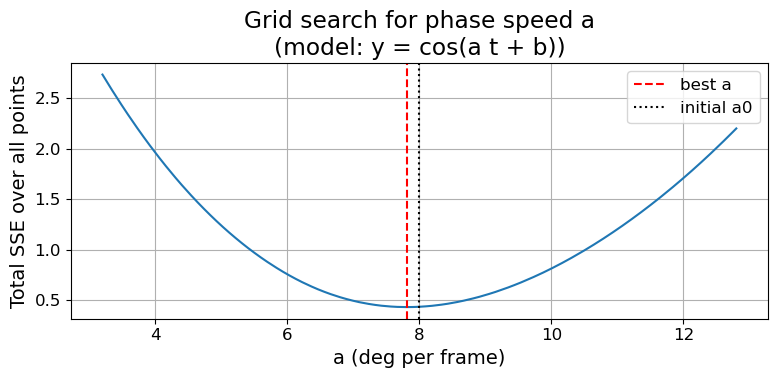


Per-point best phases (model y = cos(a t + b), A=1, C0=0):
  pt1: b ≈ 4.416 rad (253.0 deg), SSE=0.0726
  pt2: b ≈ 4.835 rad (277.0 deg), SSE=0.0294
  pt3: b ≈ 5.655 rad (324.0 deg), SSE=0.0537
  pt4: b ≈ 6.266 rad (359.0 deg), SSE=0.0443
  pt5: b ≈ 0.559 rad (32.0 deg), SSE=0.0555
  pt6: b ≈ 1.178 rad (67.5 deg), SSE=0.0850
  pt7: b ≈ 1.632 rad (93.5 deg), SSE=0.0928


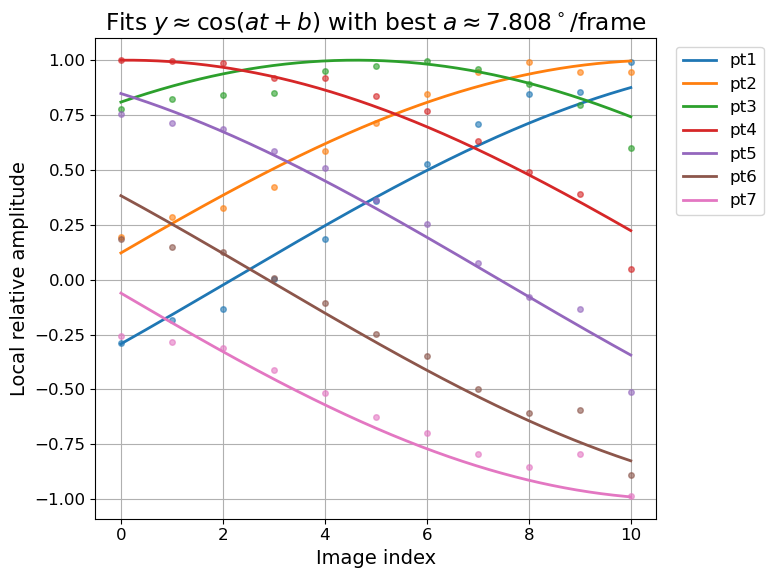

Direction = 1 (−1 means opposite propagation)
Phase shift per frame = 7.8080 deg
Frames = 11, steps = 10
Total phase span per curve ≈ 78.08 deg


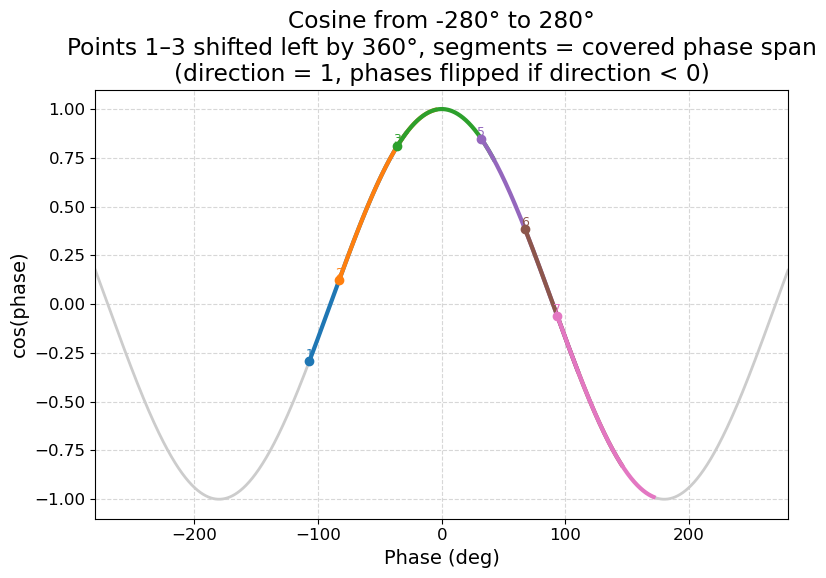

In [5]:
# %%
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

# --- Reconstruct overlay_dir exactly like in run_batch() ---
frame_dir = Path(TIFF_DIR)
if OVERLAY_DIR is not None:
    overlay_dir = Path(OVERLAY_DIR)
else:
    overlay_dir = frame_dir / "overlays_crests_phase"

csv_path = overlay_dir / "crest_relative_amplitude_evolution.csv"
print("Loading CSV from:", csv_path)

if not csv_path.exists():
    raise FileNotFoundError(f"CSV not found at {csv_path}. Run the batch script first.")

# --- Load evolution data ---
data = np.genfromtxt(csv_path, delimiter=",", skip_header=1)
t = data[:, 0]              # image indices
Y = data[:, 1:]             # shape (n_frames, n_pts)
n_frames, n_pts = Y.shape
print("Data shape (frames, points):", Y.shape)

# --- Define a consistent color set for all plots (match default Matplotlib cycle) ---
base_colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
colors = [base_colors[j % len(base_colors)] for j in range(n_pts)]

# --- Initial guess for a (same as before) ---
a0_deg = 80 / 10           # deg per frame 
a0 = np.deg2rad(a0_deg)    # rad per frame
print(f"Initial a0 ≈ {a0_deg:.6f} deg per frame")

# --- Grid search around a, with model y = cos(a t + b) (A=1, C0=0) ---
f_min, f_max = 0.4, 1.6     # ±60% around a0; tighten if needed
n_trial = 201               # number of trial a values
n_b = 720                   # number of trial b values (0..2π)

a_trial_deg = a0_deg * np.linspace(f_min, f_max, n_trial)
a_trial = np.deg2rad(a_trial_deg)
b_grid = np.linspace(0.0, 2.0 * np.pi, n_b, endpoint=False)

errors = np.zeros(n_trial)

for k, a_k in enumerate(a_trial):
    # For this trial a, precompute cos(a t + b) for all b on the grid
    base_phase = a_k * t          # shape (n_frames,)
    phase_mat = base_phase[:, None] + b_grid[None, :]   # (n_frames, n_b)
    cos_mat = np.cos(phase_mat)   # (n_frames, n_b)

    sse_total = 0.0
    for j in range(n_pts):
        y = Y[:, j][:, None]          # (n_frames, 1)
        # SSE for each b on the grid
        sse_b = np.sum((y - cos_mat)**2, axis=0)   # (n_b,)
        sse_total += np.min(sse_b)                 # best b for this point

    errors[k] = sse_total

# --- Pick best a ---
best_idx = int(np.argmin(errors))
best_a = a_trial[best_idx]
best_a_deg = a_trial_deg[best_idx]

print()
print("Best a from grid search (model y = cos(a t + b)):")
print(f"  a_best ≈ {best_a_deg:.6f} deg per frame "
      f"(initial {a0_deg:.6f}, factor {best_a_deg/a0_deg:.3f})")
print(f"  SSE_min = {errors[best_idx]:.4f}")

# --- Plot SSE vs a to see the minimum ---
plt.figure(figsize=(8, 4))
plt.plot(a_trial_deg, errors, "-")
plt.axvline(best_a_deg, color="r", linestyle="--", label="best a")
plt.axvline(a0_deg, color="k", linestyle=":", label="initial a0")
plt.xlabel("a (deg per frame)")
plt.ylabel("Total SSE over all points")
plt.title("Grid search for phase speed a\n(model: y = cos(a t + b))")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# --- For the best a, find best b for each point (still y = cos(a t + b)) ---
b_best = np.zeros(n_pts)
sse_per_point = np.zeros(n_pts)

base_phase_best = best_a * t
phase_mat_best = base_phase_best[:, None] + b_grid[None, :]
cos_mat_best = np.cos(phase_mat_best)

print("\nPer-point best phases (model y = cos(a t + b), A=1, C0=0):")
for j in range(n_pts):
    y = Y[:, j][:, None]
    sse_b = np.sum((y - cos_mat_best)**2, axis=0)
    k_b = int(np.argmin(sse_b))
    b_star = b_grid[k_b]
    b_best[j] = b_star
    sse_per_point[j] = sse_b[k_b]

    print(f"  pt{j+1}: b ≈ {b_star:.3f} rad ({np.degrees(b_star):.1f} deg), "
          f"SSE={sse_b[k_b]:.4f}")

# --- Plot data vs fitted cos(a t + b) with best a and b_j ---
t_fine = np.linspace(t.min(), t.max(), 500)

plt.figure(figsize=(10, 6))
for j in range(n_pts):
    col = colors[j]

    # data
    plt.plot(t, Y[:, j], "o", ms=4, alpha=0.6, color=col)

    # best-fit curve with A=1, C0=0
    b_star = b_best[j]
    y_fit = np.cos(best_a * t_fine + b_star)
    plt.plot(t_fine, y_fit, "-", lw=2, color=col, label=f"pt{j+1}")

plt.xlabel("Image index")
plt.ylabel("Local relative amplitude")
plt.title(
    r"Fits $y \approx \cos(a t + b)$ "
    rf"with best $a \approx {best_a_deg:.3f}^\circ$/frame"
)
plt.grid(True)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout(rect=[0, 0, 0.8, 1])
plt.show()

# %%
# ============================================================
#   Single Cosine Summary Plot (No wrap, custom shifting)
#   - Cosine domain: -270° .. +270°
#   - Points 1, 2, 3 shifted left by 360° so they appear before pt4
#   - Each point j draws a segment from start_j to start_j + phase_span
#   - Uses the SAME colors as above
#   - Direction encoded via sign: direction = -1 → opposite direction
#   - If direction < 0, flip all phases before shifting pts 1–3 by -360°
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------
# 1. Phase shift per frame from your grid search
#    Use 'direction' to encode propagation sense
# --------------------------------------------
direction = 1  # +1 = original direction, -1 = wave goes the other way

phase_shift_per_frame_deg = direction * best_a_deg
n_frames = len(t)
delta_t = n_frames - 1

total_phase_span_deg = phase_shift_per_frame_deg * delta_t

print(f"Direction = {direction} (−1 means opposite propagation)")
print(f"Phase shift per frame = {phase_shift_per_frame_deg:.4f} deg")
print(f"Frames = {n_frames}, steps = {delta_t}")
print(f"Total phase span per curve ≈ {total_phase_span_deg:.2f} deg")

# --------------------------------------------
# 2. Master cosine from -270° to +270°
# --------------------------------------------
phi_deg = np.linspace(-280, 280, 2000)
phi = np.radians(phi_deg)
cos_phi = np.cos(phi)

# --------------------------------------------
# 3. Starting phases for each point
#    - Convert to degrees
#    - If direction < 0: flip phases (multiply by -1)
#    - Then wrap to [0, 360) and do the 1–3 shift
# --------------------------------------------
start_deg = np.degrees(b_best)   # unrestricted degrees from fit

if direction < 0:
    # Flip all phases if the wave goes the other way
    start_deg = -start_deg

start_deg = start_deg % 360      # 0..360 for consistency

# Shift pt1, pt2, pt3 left by 360° so they sit before pt4
start_deg[0] -= 360
start_deg[1] -= 360
start_deg[2] -= 360

if direction < 0:
    start_deg[3] -= 360

# End phase incorporates the (signed) total span
end_deg = start_deg + total_phase_span_deg

# --------------------------------------------
# 4. Plot (using same `colors` list as before)
# --------------------------------------------
plt.figure(figsize=(10, 6))

# Base cosine
plt.plot(phi_deg, cos_phi, color="0.8", lw=2, label="cosine")

# Draw segments & starting points
for j in range(n_pts):
    c = colors[j]

    s0 = start_deg[j]      # starting phase
    s1 = end_deg[j]        # ending phase

    # Segment mask that works even if s1 < s0 (negative span)
    lo, hi = sorted((s0, s1))
    mask = (phi_deg >= lo) & (phi_deg <= hi)
    phi_seg = phi_deg[mask]
    cos_seg = cos_phi[mask] if np.any(mask) else []

    # Draw segment if visible in the -270..270 range
    if len(phi_seg) > 0:
        plt.plot(
            phi_seg,
            cos_seg,
            lw=3,
            color=c,
            label=f"pt{j+1}" if j == 0 else None,
        )

    # Mark starting point if it's in visible range
    if -280 <= s0 <= 280:
        y0 = np.cos(np.radians(s0))
        plt.scatter([s0], [y0], color=c, zorder=4)
        plt.text(
            s0,
            y0,
            f"{j+1}",
            fontsize=9,
            ha="center",
            va="bottom",
            color=c,
        )

plt.xlabel("Phase (deg)")
plt.ylabel("cos(phase)")
plt.title(
    "Cosine from -280° to 280°\n"
    "Points 1–3 shifted left by 360°, segments = covered phase span\n"
    f"(direction = {direction}, phases flipped if direction < 0)"
)
plt.xlim(-280, 280)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout(rect=[0, 0, 0.82, 1])
plt.show()


## Calculations:

$\lambda = 17.5 \ \rm{km}$

Phase shift 

78 degrees per 333 seconds or

360 degrees per 1540 seconds

Horizontal Phase Speed: 17500 m / 1580 s = 11.4 m/s

The wave is moving to the left. 
